# __From Denoising Score Matching to Denoising Diffusion Probabilistic Models__
__Students__ : VERNIER Noé, PAQUIN Enguerrand, GRATIAS-QUIQUANDON Philippe

### Global Imports

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
from tqdm import tqdm
import matplotlib.pyplot as plt
import numpy as np
import torchvision.datasets as datasets
import torchvision.transforms as transforms
import wandb
import math
import os
from PIL import Image

# ____Langevin Dynamics____

### Sampling a simple gaussian using Langevin Dynamics

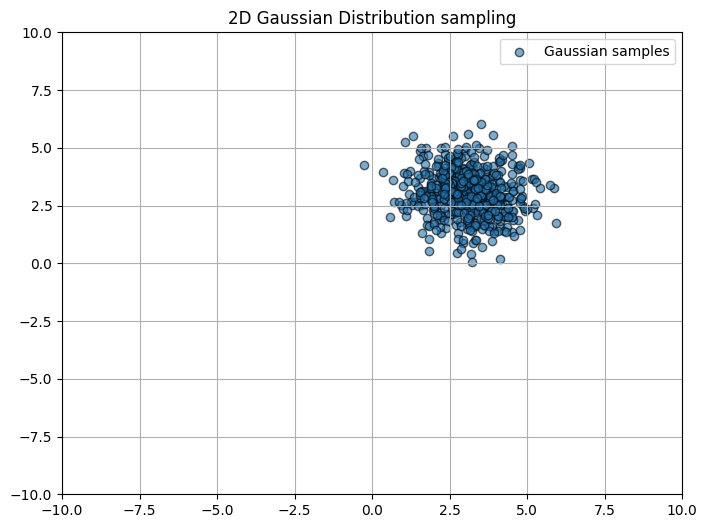

In [ ]:
sigma = 1

mean = [3, 3]
cov = sigma*np.eye(2)

samples = np.random.multivariate_normal(mean, cov, 500)

plt.figure(figsize=(8, 6))
plt.scatter(samples[:, 0], samples[:, 1], alpha=0.6, label='Gaussian samples', edgecolor='k')
plt.xlim(-10, 10)
plt.ylim(-10, 10)
plt.title("2D Gaussian Distribution sampling")
plt.legend()
plt.grid(True)
plt.show()

For a gaussian, $(\nabla_x \log p)(x) = \Sigma^{-1}(x-\mu)$

In [ ]:
def grad_log_p(x, mean, cov):
    cov_inv = np.linalg.inv(cov)
    return -np.dot(cov_inv, (x - mean))

In [ ]:
x_0 = np.array([-10,-10])

num_steps = 1000
step_size = 0.01
noise_scale = np.sqrt(2 * step_size)

In [ ]:
def langevin_dynamics(x_init, mean, cov, num_steps, step_size, noise_scale):
    trajectory = [x_init]
    x = x_init
    for _ in range(num_steps):
        grad = grad_log_p(x, mean, cov)
        noise = np.random.normal(0, noise_scale, size=x.shape)
        x = x + step_size * grad + noise
        trajectory.append(x)
    return np.array(trajectory)

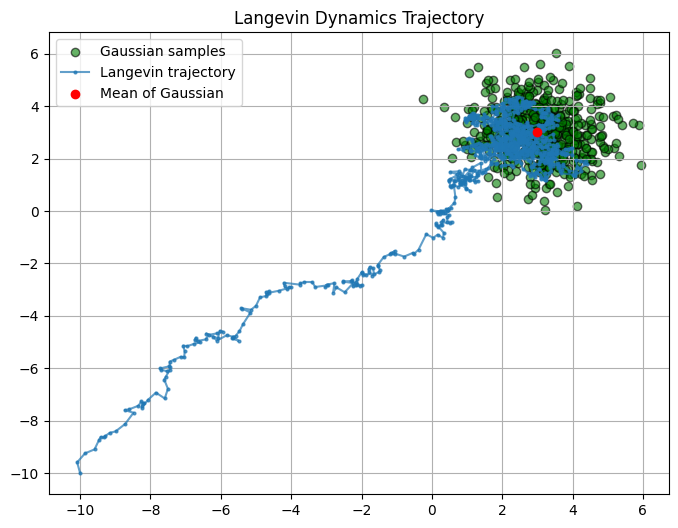

In [ ]:
trajectory = langevin_dynamics(x_0, mean, cov, num_steps, step_size, noise_scale)

# Plot the trajectory
plt.figure(figsize=(8, 6))
plt.scatter(samples[:, 0], samples[:, 1], alpha=0.6, label='Gaussian samples', edgecolor='k', color='green')
plt.plot(trajectory[:, 0], trajectory[:, 1], '-o', markersize=2, alpha=0.7, label='Langevin trajectory')
plt.scatter(mean[0], mean[1], color='red', label='Mean of Gaussian', zorder=5)
plt.title("Langevin Dynamics Trajectory")
plt.legend()
plt.grid(True)

### Mixed gaussians and Langevin Dynamics

In [ ]:
sigma1 = 1
sigma2 = sigma1

mean1 = [3, 3]
cov1 = sigma1*np.eye(2)

mean2 = [-3, -3]
cov2 = sigma2*np.eye(2)

alpha1 = 0.9
alpha2 = 0.1

def generate_sample():
    if np.random.rand() < alpha1:
        return np.random.multivariate_normal(mean1, cov1)
    else:
        return np.random.multivariate_normal(mean2, cov2)

num_samples = 1000
samples = np.array([generate_sample() for _ in range(num_samples)])

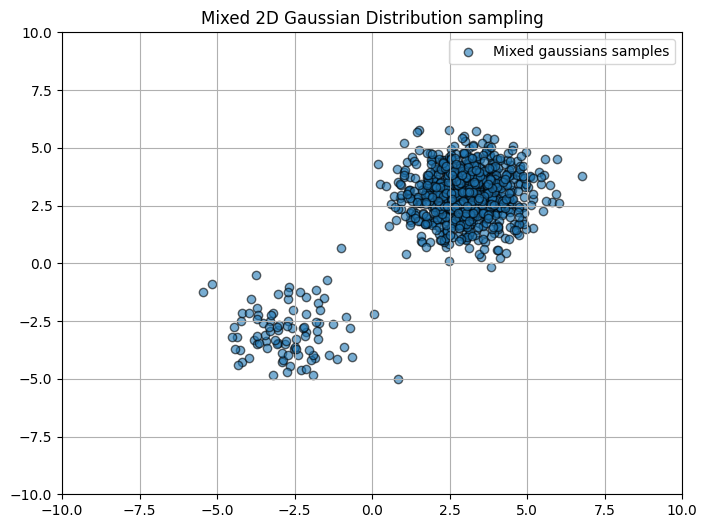

In [ ]:
plt.figure(figsize=(8, 6))
plt.scatter(samples[:,0], samples[:,1], alpha=0.6, label=f'Mixed gaussians samples', edgecolor='k')
plt.xlim(-10, 10)
plt.ylim(-10, 10)
plt.title("Mixed 2D Gaussian Distribution sampling")
plt.legend()
plt.grid(True)

$$
\nabla_x \log p(x) = \dfrac{\nabla_x p(x)}{p(x)}
$$ and it gives us for the mixed gaussian :
* $p(x) = \alpha p_1 (x) + (1-\alpha) p_2(x)$
* $\nabla_x p(x) = \alpha \nabla_x p_1(x) + (1-\alpha) \nabla_x p_2(x)$
* $\forall i \quad \nabla_x p_i(x) = p_i(x)\nabla_x\log p_i(x)$

In [ ]:
def multivariate_gaussian_density(x, mean, cov): # Compute p_i(x)
    size = len(mean)
    cov_det = np.linalg.det(cov)
    cov_inv = np.linalg.inv(cov)
    norm_const = 1.0 / (np.power((2 * np.pi), float(size) / 2) * np.sqrt(cov_det))
    x_mean = x - mean
    result = np.exp(-0.5 * np.dot(np.dot(x_mean.T, cov_inv), x_mean))
    return norm_const * result

In [ ]:
def grad_log_p_mixed(x, mean1, mean2, cov1, cov2):
    p1 = alpha1 * multivariate_gaussian_density(x, mean1, cov1)
    p2 = alpha2 * multivariate_gaussian_density(x, mean2, cov2)

    p = p1 + p2

    grad1 = grad_log_p(x, mean1, cov1)
    grad2 = grad_log_p(x, mean2, cov2)

    grad = (p1 * grad1 + p2 * grad2) / p
    return grad

In [ ]:
x = np.linspace(-10, 10, 50)
y = np.linspace(-10, 10, 50)
X, Y = np.meshgrid(x, y)
points = np.stack([X.ravel(), Y.ravel()], axis=1)

# Compute gradients for both Gaussians
gradmixed = np.array([grad_log_p_mixed(p,mean1,mean2,cov1,cov2) for p in points])

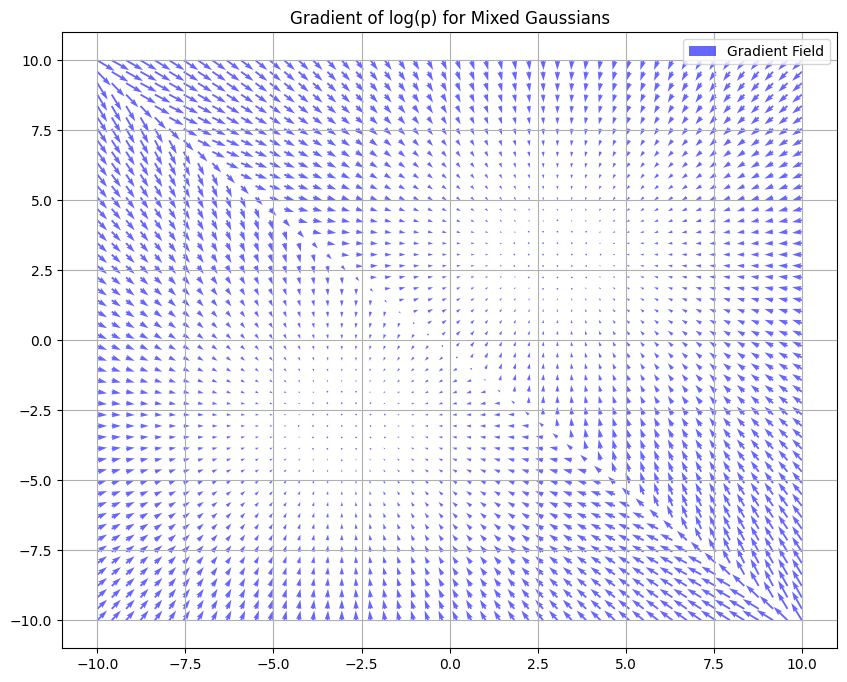

In [ ]:
U = gradmixed[:, 0].reshape(X.shape)
V = gradmixed[:, 1].reshape(X.shape)

# Plot the gradient field for both Gaussians
plt.figure(figsize=(10, 8))
plt.quiver(X, Y, U, V, color='blue', alpha=0.6, label='Gradient Field')
plt.legend()
plt.grid(True)
plt.title('Gradient of log(p) for Mixed Gaussians')
plt.show()

In [ ]:
num_steps = 500
step_size = 0.01  # epsilon/2
noise_scale = np.sqrt(2 * step_size)

In [ ]:
def langevin_dynamics_mixed(x_init, mean1, mean2, cov1, cov2, num_steps, step_size, noise_scale):
    trajectory = [x_init]
    x = x_init
    for _ in range(num_steps):
        grad = grad_log_p_mixed(x, mean1, cov1, mean2, cov2)
        noise = np.random.normal(0, noise_scale, size=x.shape)
        x = x + step_size * grad + noise
        trajectory.append(x)
    return np.array(trajectory)

[8.87090769 0.84903278]


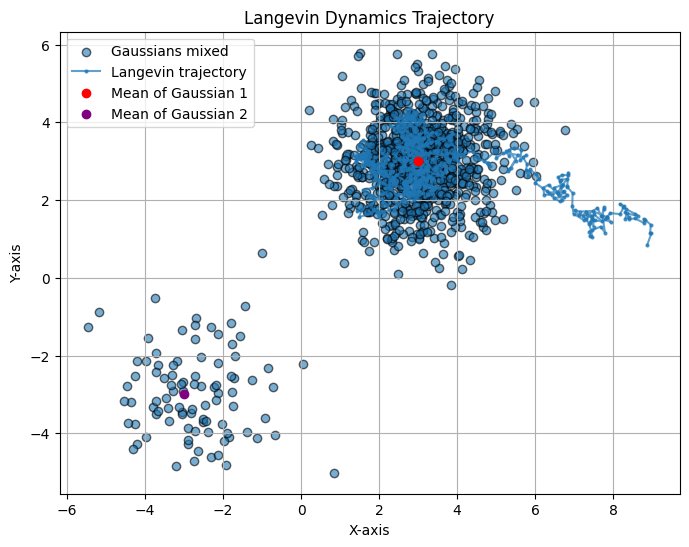

In [ ]:
x_0 = np.random.uniform(-10,10,2)
print(x_0)

trajectory = langevin_dynamics_mixed(x_0, mean1, cov1, mean2, cov2, num_steps, step_size, noise_scale)

plt.figure(figsize=(8, 6))
plt.scatter(samples[:, 0], samples[:, 1], alpha=0.6, label='Gaussians mixed', edgecolor='k')
plt.plot(trajectory[:, 0], trajectory[:, 1], '-o', markersize=2, alpha=0.7, label='Langevin trajectory')
plt.scatter(mean1[0], mean1[1], color='red', label='Mean of Gaussian 1', zorder=5)
plt.scatter(mean2[0], mean2[1], color='purple', label='Mean of Gaussian 2', zorder=5)
plt.title("Langevin Dynamics Trajectory")
plt.xlabel("X-axis")
plt.ylabel("Y-axis")
plt.legend()
plt.grid(True)

In [ ]:
langevin_generated = []

for i in tqdm(range(num_samples)):
    x_0 = np.random.uniform(-10,10,2)
    trajectory = langevin_dynamics_mixed(x_0, mean1, cov1, mean2, cov2, num_steps, step_size, noise_scale)
    langevin_generated.append(trajectory[-1])
langevin_generated = np.array(langevin_generated)

100%|██████████| 1000/1000 [01:21<00:00, 12.26it/s]


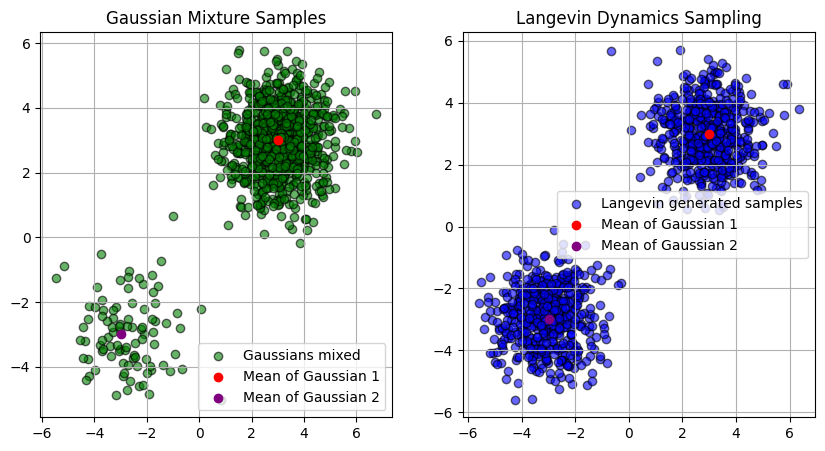

In [ ]:
plt.figure(figsize=(10, 5))

# First subplot: Gaussian mixture samples
plt.subplot(1, 2, 1)
plt.scatter(samples[:, 0], samples[:, 1], alpha=0.6, label='Gaussians mixed', edgecolor='k', color='green')
plt.scatter(mean1[0], mean1[1], color='red', label='Mean of Gaussian 1', zorder=5)
plt.scatter(mean2[0], mean2[1], color='purple', label='Mean of Gaussian 2', zorder=5)
plt.title("Gaussian Mixture Samples")
plt.legend()
plt.grid(True)

# Second subplot: Langevin trajectory
plt.subplot(1, 2, 2)
plt.scatter(langevin_generated[:, 0], langevin_generated[:, 1], alpha=0.6, label='Langevin generated samples', edgecolor='k', color='blue')
plt.scatter(mean1[0], mean1[1], color='red', label='Mean of Gaussian 1', zorder=5)
plt.scatter(mean2[0], mean2[1], color='purple', label='Mean of Gaussian 2', zorder=5)
plt.title("Langevin Dynamics Sampling")
plt.legend()
plt.grid(True)

# __SSM Loss Comparison for $\tilde{x}$ and $x$__



### __Model Config__

In [ ]:
wandb.init(
    project="training-rescore",
    config={
        "batch_size": 128,
        "learning_rate": 0.001,
        "n_epochs": 50,
        "model_config": {
            "nef": 32,
            "ndf": 32
        }
    }
)

### __Model Architecture__

In [ ]:
class ConvResBlock(nn.Module):
    def __init__(self, in_channel, out_channel, resize=False):
        super().__init__()
        self.resize = resize

        if not resize:
            self.main = nn.Sequential(
                nn.Conv2d(in_channel, out_channel, 3, stride=1, padding=1),
                nn.GroupNorm(8, out_channel),
                nn.ELU(),
                nn.Conv2d(out_channel, out_channel, 3, stride=1, padding=1),
                nn.GroupNorm(8, out_channel)
            )
        else:
            self.main = nn.Sequential(
                nn.Conv2d(in_channel, out_channel, 3, stride=2, padding=1),
                nn.GroupNorm(8, out_channel),
                nn.ELU(),
                nn.Conv2d(out_channel, out_channel, 3, stride=1, padding=1),
                nn.GroupNorm(8, out_channel)
            )
            self.residual = nn.Conv2d(in_channel, out_channel, 3, stride=2, padding=1)

        self.final_act = nn.ELU()

    def forward(self, inputs):
        if not self.resize:
            h = self.main(inputs)
            h += inputs
        else:
            h = self.main(inputs)
            res = self.residual(inputs)
            h += res
        return self.final_act(h)

class DeconvResBlock(nn.Module):
    def __init__(self, in_channel, out_channel, resize=False):
        super().__init__()
        self.resize = resize

        if not resize:
            self.main = nn.Sequential(
                nn.ConvTranspose2d(in_channel, out_channel, 3, stride=1, padding=1),
                nn.GroupNorm(8, out_channel),
                nn.ELU(),
                nn.ConvTranspose2d(out_channel, out_channel, 3, stride=1, padding=1),
                nn.GroupNorm(8, out_channel)
            )
        else:
            self.main = nn.Sequential(
                nn.ConvTranspose2d(in_channel, out_channel, 3, stride=1, padding=1),
                nn.GroupNorm(8, out_channel),
                nn.ELU(),
                nn.ConvTranspose2d(out_channel, out_channel, 3, stride=2, padding=1, output_padding=1),
                nn.GroupNorm(8, out_channel)
            )
            self.residual = nn.ConvTranspose2d(in_channel, out_channel, 3, stride=2, padding=1, output_padding=1)

        self.final_act = nn.ELU()

    def forward(self, inputs):
        if not self.resize:
            h = self.main(inputs)
            h += inputs
        else:
            h = self.main(inputs)
            res = self.residual(inputs)
            h += res
        return self.final_act(h)


class ResNet(nn.Module):
    def __init__(self, config):
        super().__init__()
        self.nef = config["nef"]
        self.ndf = config["ndf"]
        self.channels = config["channels"]
        act = 'elu'
        self.convs = nn.Sequential(
            nn.Conv2d(self.channels, self.nef, 3, 1, 1),
            ConvResBlock(self.nef, self.nef, act=act),
            ConvResBlock(self.nef, 2 * self.nef, resize=True, act=act),
            ConvResBlock(2 * self.nef, 2 * self.nef, act=act),
            ConvResBlock(2 * self.nef, 4 * self.nef, resize=True, act=act),
            ConvResBlock(4 * self.nef, 4 * self.nef, act=act),
        )

        self.deconvs = nn.Sequential(
            DeconvResBlock(4 * self.ndf, 4 * self.ndf, act=act),
            DeconvResBlock(4 * self.ndf, 2 * self.ndf, resize=True, act=act),
            DeconvResBlock(2 * self.ndf, 2 * self.ndf, act=act),
            DeconvResBlock(2 * self.ndf, self.ndf, resize=True, act=act),
            DeconvResBlock(self.ndf, self.ndf, act=act),
            nn.Conv2d(self.ndf, self.channels, 3, 1, 1)
        )

    def forward(self, x):
        x = 2 * x - 1.
        res = self.deconvs(self.convs(x))
        return res

### __Loss Function (SSM)__

$$
\min_\theta \mathbb{E}_{p_{\text{data}}(x)} \left(\frac{1}{2}\lVert s_\theta(\mathbf{x})  \rVert^2 + \text{tr}(\nabla_x s_\theta(\mathbf{x}) ) \right)
$$

In [ ]:
def loss(model, x):
  x.requires_grad_(True)
  s = model(x)
  grad_s = torch.autograd.grad(s.sum(),x,create_graph=True)[0]
  tr = grad_s.diagonal(dim1=-2, dim2=-1).sum(dim=-1)
  l = tr + 1/2*torch.norm(s.reshape(s.shape[0], s.shape[1], -1), dim=-1)**2
  return l.mean()

### __Download Dataset (MNIST and CIFAR10)__

- MNIST : __70000__ *28x28* grayscale images of written digits
- CIFAR10: __60000__ *30x30* colour images in 10 classes.


In [ ]:
tf = transforms.Compose([transforms.ToTensor()])

mnist_trainset = datasets.MNIST(root='./data', train=True, download=True, transform=tf)
mnist_testset = datasets.MNIST(root='./data', train=False, download=True, transform=tf)

cifar_trainset = datasets.CIFAR10(root='./data', train=True, download=True, transform=tf)
cifar_testset = datasets.CIFAR10(root='./data', train=False, download=True, transform=tf)

### __Define the model, dataLoader and optimize__


In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = ResNet(wandb.config["model_config"]).to(device=device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
train_dl = DataLoader(cifar_trainset, batch_size=128, shuffle=True)
test_dl = DataLoader(cifar_testset, batch_size=128, shuffle=True)

### __Train function for SSM__

In [ ]:
def train(train_dl, model, optimizer, loss_fn, n_epochs, sigma=0, loss_name="SSM Loss"):
    model = model.to(device)
    model.train()
    loss_list = []
    iteration = 0
    for e in range(n_epochs):
        for x,_ in tqdm(train_dl):
            x = x.to(device)
            x = x + torch.rand_like(x) * sigma
            optimizer.zero_grad()
            scaled_score = lambda x: model(x)
            loss = loss_fn(scaled_score, x.detach())

            loss.backward()
            optimizer.step()

            loss_list.append(loss.item())
            iteration += 1
            wandb.log({"iteration": iteration, loss_name: loss.item()})
    return loss_list

### __Train without adding noise to the data__

In [ ]:
loss_list = train(train_dl, model, optimizer, loss, wandb.config["n_epochs"])

### __Train with adding noise to the data__

In [ ]:
model = ResNet(wandb.config["model_config"]).to(device=device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

In [ ]:
loss_list_noise = train(train_dl, model, optimizer, loss, wandb.config["n_epochs"], sigma=0.01, loss_name="SSM Loss with Noise")

In [ ]:
import pickle
with open("loss_list_noise", "wb") as fp:
    pickle.dump(loss_list_noise, fp)
with open("loss_list", "wb") as fp:
    pickle.dump(loss_list, fp)

## __Sample Using Langevin Dynamics__

----




In [ ]:
config={
        "batch_size": 128,
        "learning_rate": 0.001,
        "n_epochs": 50,
        "model_config": {
            "nef": 32,
            "ndf": 32,
            "channels": 1
        }
    }
model = ResNet(config["model_config"])
model.load_state_dict(torch.load("model_epoch_50.pth", map_location='cuda')) # Model trained on noise data

<ipython-input-14-3145d0e6ed73>:12: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("model_epoch_50.pth", map_location='cuda'))


<All keys matched successfully>

In [ ]:
eps = 1e-5
N = 5
n = 20
T = n * 100

model.eval()
def langevin_dynamics(x, model, T, eps):
    for t in range(T):
        with torch.no_grad():
            x_grad = model(x)
        x += eps/2 * x_grad + np.sqrt(eps) * torch.randn_like(x)
    return x

results = np.zeros((N, n, 28, 28)) # 5 samples, 10 steps, 28x28 images
for i in range(N):
    x = torch.randn(1, 1, 28, 28)
    for j in tqdm(range(n)):
        results[i, j] = x.squeeze().detach().numpy()
        x = langevin_dynamics(x, model, T, eps)


In [ ]:
fig, axes = plt.subplots(N, n, figsize=(n * 2, N * 2))

for i in range(N):
    for j in range(n):
        ax = axes[i, j]
        ax.imshow(results[i, j], cmap='gray')
        ax.axis('off')
plt.tight_layout()
plt.show()

# __Noise Conditional Score Networks__

## __UNet with ResBlocks and Attention__

In [ ]:
class TimeEmbeddings(nn.Module):
    def __init__(self, n_channels):
        super().__init__()
        self.n_channels = n_channels
        self.half_dim = n_channels // 8
        self.lin1 = nn.Linear(n_channels//4, n_channels)
        self.act = nn.SiLU()
        self.lin2 = nn.Linear(n_channels, n_channels)

    def forward(self, t):
        emb = math.log(10000) / (self.half_dim-1)
        emb = torch.exp(torch.arange(self.half_dim, device=t.device) * -emb)
        emb = t[:,None] * emb[None,:]
        emb = torch.cat((emb.sin(), emb.cos()), dim=1)
        emb = self.act(self.lin1(emb))
        return self.lin2(emb)

class ResBlock(nn.Module):
    def __init__(self, in_channels, out_channels, time_channels, n_groups=32, dropout=0.1):
        super().__init__()
        self.convBlock_in = nn.Sequential(
            nn.GroupNorm(n_groups, in_channels),
            nn.SiLU(),
            nn.Conv2d(in_channels, out_channels, kernel_size=(3,3), padding=(1,1))
        )
        self.timeBlock = nn.Sequential(
            nn.SiLU(),
            nn.Linear(time_channels, out_channels)
        )
        self.convBlock_out = nn.Sequential(
            nn.GroupNorm(n_groups, out_channels),
            nn.SiLU(),
            nn.Dropout(dropout),
            nn.Conv2d(out_channels, out_channels, kernel_size=(3,3), padding=(1,1))
        )
        if in_channels != out_channels:
            self.shortcut = nn.Conv2d(in_channels, out_channels, kernel_size=(1,1))
        else:
            self.shortcut = nn.Identity()

    def forward(self,x,t):
        emb = self.convBlock_in(x)
        emb += self.timeBlock(t)[:,:,None,None]
        out = self.convBlock_out(emb)
        return out + self.shortcut(x)

class AttentionBlock(nn.Module):
    def __init__(self, channels, n_heads=1, d_k=None):
        super().__init__()
        if d_k is None:
            d_k = channels
        self.to_q = nn.Linear(channels, d_k * n_heads, bias=False)
        self.to_k = nn.Linear(channels, d_k * n_heads, bias=False)
        self.to_v = nn.Linear(channels, d_k * n_heads, bias=False)
        self.fc_out = nn.Linear(d_k * n_heads, channels)

        self.norm_factor = d_k ** -0.5
        self.n_heads = n_heads
        self.d_k = d_k

    def forward(self, x):
        B,C,H,W = x.shape
        x = x.reshape(B,C,-1).permute(0,2,1)

        Q = self.to_q(x).reshape(B, -1, self.n_heads, self.d_k)
        K = self.to_k(x).reshape(B, -1, self.n_heads, self.d_k)
        V = self.to_v(x).reshape(B, -1, self.n_heads, self.d_k)

        attn = nn.Softmax(dim=2)(torch.einsum('bihd,bjhd->bijh', [Q,K]) * self.norm_factor)

        multi_out = torch.einsum('bijh,bjhd->bihd', [attn,V]).view(B,-1,self.n_heads * self.d_k)
        out = self.fc_out(multi_out)
        out += x
        out = out.permute(0,2,1).view(B,C,H,W)
        return out

class DownBlock(nn.Module):
    def __init__(self, in_channels, out_channels, time_channels, has_attn):
        super().__init__()
        self.resBlock = ResBlock(in_channels, out_channels, time_channels)
        if has_attn:
            self.attn = AttentionBlock(out_channels)
        else:
            self.attn = nn.Identity()

    def forward(self, x, t):
        emb = self.resBlock(x,t)
        out = self.attn(emb)
        return out

class UpBlock(nn.Module):
    def __init__(self, in_channels, out_channels, time_channels, has_attn):
        super().__init__()
        self.resBlock = ResBlock(in_channels + out_channels, out_channels, time_channels)
        if has_attn:
            self.attn = AttentionBlock(out_channels)
        else:
            self.attn = nn.Identity()

    def forward(self, x, t):
        emb = self.resBlock(x,t)
        out = self.attn(emb)
        return out

class MiddleBlock(nn.Module):
    def __init__(self, channels, time_channels):
        super().__init__()
        self.resBlock1 = ResBlock(channels, channels, time_channels)
        self.attn = AttentionBlock(channels)
        self.resBlock2 = ResBlock(channels, channels, time_channels)

    def forward(self,x,t):
        emb = self.resBlock1(x,t)
        emb = self.attn(emb)
        out = self.resBlock2(emb,t)
        return out

class UpSample(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.conv = nn.ConvTranspose2d(channels, channels, (4,4), (2,2), (1,1))

    def forward(self,x,t):
        return self.conv(x)

class DownSample(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.conv = nn.Conv2d(channels, channels, (3,3), (2,2), (1,1))

    def forward(self,x,t):
        return self.conv(x)

class UNet(nn.Module):
    def __init__(self, image_channels=3, channels=64, ch_mult=(1,2,2,4), is_attn=(False,False,True,True), n_blocks=2):
        super().__init__()
        n_res = len(ch_mult)
        self.img_proj = nn.Conv2d(image_channels, channels, kernel_size=(3,3), padding=(1,1))
        time_channels = channels*4
        self.time_emb = TimeEmbeddings(time_channels)

        down=[]
        out_channels=in_channels=channels
        for i in range(n_res):
            out_channels = in_channels * ch_mult[i]
            for _ in range(n_blocks):
                down.append(DownBlock(in_channels, out_channels, time_channels, is_attn[i]))
                in_channels = out_channels
            if i < n_res-1:
                down.append(DownSample(out_channels))
        self.down = nn.ModuleList(down)

        self.mid = MiddleBlock(out_channels, time_channels)

        up=[]
        in_channels=out_channels
        for i in reversed(range(n_res)):
            out_channels = in_channels
            for _ in range(n_blocks):
                up.append(UpBlock(in_channels, out_channels, time_channels, is_attn[i]))
            out_channels = in_channels // ch_mult[i]
            up.append(UpBlock(in_channels, out_channels, time_channels, is_attn[i]))
            in_channels = out_channels

            if i>0:
                up.append(UpSample(out_channels))
        self.up = nn.ModuleList(up)

        self.norm = nn.GroupNorm(8,channels)
        self.act = nn.SiLU()
        self.final = nn.Conv2d(channels, image_channels, kernel_size=(3,3), padding=(1,1))

    def forward(self, x, t):
        t = self.time_emb(t)
        x = self.img_proj(x)

        all_x = [x]
        for block in self.down:
            x = block(x,t)
            all_x.append(x)

        x = self.mid(x,t)

        for block in self.up:
            if isinstance(block, UpSample):
                x = block(x,t)
            else:
                s = all_x.pop()
                x = torch.cat((x,s),dim=1)
                x = block(x,t)

        return self.final(self.act(self.norm(x)))

### __NCSN Loss__

$$
\ell(\theta; \sigma) = \frac{1}{2} \mathbb{E}_{p_\text{data}(\mathbf{x})} \mathbb{E}_{\tilde{\mathbf{x}} \sim N(\mathbf{x}, \sigma^2 I)} \Big[\big\| \mathbf{s}_\theta(\tilde{\mathbf{x}}, \sigma) + \frac{\tilde{\mathbf{x}} - \mathbf{x}}{\sigma^2} \big\|_2^2\Big].
$$

In [ ]:
def ncsn_loss(model, x, labels, sigmas):
    used_sigmas = sigmas[labels].view(x.shape[0], *([1] * len(x.shape[1:])))
    x_tilde = x + torch.randn_like(x) * used_sigmas
    target = - 1 / (used_sigmas ** 2) * (x_tilde - x)
    s = model(x_tilde, labels)
    target = target.view(target.shape[0], -1)
    s = s.view(s.shape[0], -1)
    loss = 1 / 2. * ((s - target) ** 2).sum(dim=-1) * used_sigmas.squeeze() ** 2
    return loss.mean(dim=0)

### __Train the model by uniformly sampling $\sigma$ at each iteration__



In [ ]:

def train(model, optim, dl_train, sigmas, n_epochs, device, log=True):
    model = model.to(device)
    tr_ite = 0
    for e in range(1,n_epochs+1):
        cur_loss = 0
        for x, _ in tqdm(dl_train):
            tr_ite += 1
            x = x.to(device)
            B = x.shape[0]
            labels = torch.randint(0, len(sigmas), (B,), device=device, dtype=torch.long)
            optim.zero_grad()
            loss = ncsn_loss(model, x, labels, sigmas)
            loss.backward()
            optim.step()
            cur_loss += loss.item()
            if log:
                wandb.log({"train_step": tr_ite, "train_loss": loss.item()})
        print(f"Epoch {e} Train Loss = {cur_loss/len(dl_train)}")

        if e%5==0 or e==n_epochs:
            name = e if e != n_epochs else "final"
            torch.save(model, f"NCSN-MNIST_{name}.pth")
    if log:
        wandb.finish()



### __Define the model and parameters__

In [ ]:
log = True
device = "cuda"
config = {
    "batch_size": 128,
    "learning_rate": 2e-5,
    "n_epochs": 100,
    "n_steps": 10,
    "model_config": {
        "channels":64,
        "ch_mult":(1,2,2),
        "is_attn":(False,False,True),
        "n_blocks":2
    }
}
model = UNet(image_channels=1,
             channels=config["model_config"]["channels"],
             ch_mult=config["model_config"]["ch_mult"],
             is_attn=config["model_config"]["is_attn"],
             n_blocks=config["model_config"]["n_blocks"]
        )

optimizer = torch.optim.Adam(model.parameters(), lr=config["learning_rate"])

tf = transforms.Compose([transforms.ToTensor()])

mnist_trainset = datasets.MNIST(root='./data', train=True, download=True, transform=tf)
train_dl = DataLoader(mnist_trainset, batch_size=config["batch_size"], shuffle=True)

sigmas = torch.logspace(0, -2, config["n_steps"], base=10.0).to(device)

### __Train the model__

In [ ]:
train(model, optimizer, train_dl, sigmas, config["n_epochs"], device, log=log)

In [ ]:
model = torch.load(f"NCSN-MNIST_15.pth")

### __Sampling data acording to Annealed Langevin Algorithm__

In [ ]:
def annealed_langevin_sampling(model, sigmas, T, device, eps=2e-5, num_samples=1):
    x = torch.randn(num_samples, 1, 28, 28, device=device)
    model.eval()
    images = []
    with torch.no_grad():
        for i in tqdm(range(len(sigmas))):
            sigma = sigmas[i]
            alpha = eps * (sigma / sigmas[-1])**2
            labels =  torch.ones(x.shape[0], device=device) * i
            images.append(x.detach().cpu().numpy())
            for _ in range(T):
                s = model(x, labels)
                z = torch.randn_like(x)
                x = x + alpha * s + torch.sqrt(2*alpha) * z
    return np.array(images)

In [ ]:
num_samples = 3
images = annealed_langevin_sampling(model, sigmas, 100, device, num_samples=num_samples)

### __Plot the data__

In [ ]:
fig, ax = plt.subplots(
    num_samples, len(sigmas), figsize=(10, 3.6),
    gridspec_kw={'wspace': 0.05, 'hspace': 0.01}
)

for i in range(num_samples):
    for j in range(len(sigmas)):
        xt = images[j, i]

        xt = (xt - xt.min()) / (xt.max() - xt.min())

        ax[i, j].imshow(xt[0], cmap="gray")
        ax[i, j].set_axis_off()

        if j == 0 and i!=0:
            ax[i, j].set_title(f"Sample {i}", fontsize=8, loc="left")
        if i == 0:
            ax[i, j].set_title(f"$\sigma =$ {sigmas[j]:0.2f}", fontsize=8, loc="center", rotation=45)

plt.subplots_adjust(top=0.95, bottom=0.05, left=0.05, right=0.95)
plt.show()



# __Denoising Diffusion Probabilistic Models__

### __Define the model__

In [ ]:
def gather(consts, t):
    """Gather consts for $t$ and reshape to feature map shape"""
    c = consts.gather(-1, t)
    return c.reshape(-1, 1, 1, 1)

class DDPM(nn.Module):
    def __init__(self, eps_model, n_steps, device, vae=None):
        super().__init__()
        self.eps_model = eps_model
        self.beta = torch.linspace(1e-4, 2e-2, n_steps).to(device)
        self.alpha = 1 - self.beta
        self.alpha_bar = torch.cumprod(self.alpha, dim=0)
        self.n_steps = n_steps
        self.sigma2 = self.beta
        self.vae = vae

    def q_xt_x0(self, x0, t):
        mean = gather(self.alpha_bar, t) ** 0.5 * x0
        var = 1 - gather(self.alpha_bar, t)
        return mean, var

    def q_sample(self, x0, t, eps=None):
        if eps is None:
            eps = torch.randn_like(x0)
        mean, var = self.q_xt_x0(x0,t)
        return mean + var**0.5 * eps

    def p_sample(self, xt, t):
        eps_theta = self.eps_model(xt,t)
        alpha_bar = gather(self.alpha_bar, t)
        alpha = gather(self.alpha,t)
        eps_coeff = (1-alpha) / (1-alpha_bar)**0.5
        mean = 1/(alpha**0.5) * (xt - eps_coeff * eps_theta)
        var = gather(self.sigma2, t)
        eps = torch.randn(xt.shape, device=xt.device)
        return mean + (var**0.5) * eps

    def loss(self, x0, noise=None):
        B = x0.shape[0]
        t = torch.randint(0, self.n_steps, (B,), device=x0.device, dtype=torch.long)
        if noise is None:
            noise = torch.randn_like(x0)
        xt = self.q_sample(x0,t,eps=noise)
        eps_theta = self.eps_model(xt, t)
        return nn.functional.mse_loss(noise, eps_theta)

    def sample_all(self, xt):
        all_x = [xt]
        t = torch.tensor([self.n_steps-1], device=xt.device)
        while t.item() >= 0:
            with torch.no_grad():
                xt = self.p_sample(xt,t)
                if self.vae:
                    xt = self.vae.decoder(xt / 0.18215).clamp(0,1)
            all_x.append(xt.cpu())
            t -= 1
        return all_x

    def sample(self, xt):
        t = torch.tensor([self.n_steps-1], device=xt.device)
        while t.item() >= 0:
            with torch.no_grad():
                xt = self.p_sample(xt,t)
            t -= 1
        if self.vae:
            with torch.no_grad():
                xt = self.vae.decoder(xt / 0.18215).clamp(0,1)
        return xt.cpu()

### __Train function__

In [ ]:
def train(model, optim, dl_train, dl_test, n_steps, n_epochs, device, log=True):
    model = model.to(device)
    diffusion = DDPM(model, n_steps, device)
    tr_ite = 0
    ev_ite = 0
    for e in range(1,n_epochs+1):
        cur_loss = 0
        diffusion.eps_model.train()
        for x,_ in tqdm(dl_train):
            tr_ite += 1
            x = x.to(device)
            optim.zero_grad()
            loss = diffusion.loss(x)
            loss.backward()
            optim.step()
            cur_loss += loss.item()
            if log:
                wandb.log({"train_step": tr_ite, "train_loss": loss.item()})
        print(f"Epoch {e} Train Loss = {cur_loss/len(dl_train)}")

        cur_loss = 0
        diffusion.eps_model.eval()
        for x,_ in tqdm(dl_test):
            ev_ite += 1
            x = x.to(device)
            with torch.no_grad():
                loss = diffusion.loss(x)
            cur_loss += loss.item()
            if log:
                wandb.log({"eval_step": ev_ite, "eval_loss": loss.item()})
        print(f"Epoch {e} Test Loss = {cur_loss/len(dl_test)}")

        if e%25==0 or e==n_epochs:
            name = e if e != n_epochs else "final"
            torch.save(diffusion.eps_model, f"DiffUNet_{name}.pth")
    if log:
        wandb.finish()

### __Train on MNIST__

In [ ]:
log = False
device = "cuda"
config = {
    "batch_size": 128,
    "learning_rate": 2e-5,
    "n_epochs": 125,
    "n_steps": 1000,
    "model_config": {
        "channels":64,
        "ch_mult":(1,2,4),
        "is_attn":(False,False,True),
        "n_blocks":2
    }
}
if log:
    wandb.init(
        project="DDPM",
        name="DDPM-MNIST-1",
        config=config
    )

model = UNet(image_channels=1,
             channels=config["model_config"]["channels"],
             ch_mult=config["model_config"]["ch_mult"],
             is_attn=config["model_config"]["is_attn"],
             n_blocks=config["model_config"]["n_blocks"]
        )
optimizer = torch.optim.Adam(model.parameters(), lr=config["learning_rate"])
tf = transforms.Compose([transforms.ToTensor()])

mnist_trainset = datasets.MNIST(root='./data', train=True, download=True, transform=tf)
mnist_testset = datasets.MNIST(root='./data', train=False, download=True, transform=tf)
dl_train = DataLoader(mnist_trainset, batch_size=config["batch_size"], shuffle=True)
dl_test = DataLoader(mnist_testset, batch_size=config["batch_size"], shuffle=False)

train(model, optimizer, dl_train, dl_test, config["n_steps"], config["n_epochs"], device, log=log)

### __Sample on ANIME dataset__

We trained the same way than MNIST on an anime dataset on our GPUs, here are the results

In [ ]:
!wget -O ANIME_DiffUNet_final.pth https://rky.ovh/nextcloud/index.php/s/QxYYRqnpxM7KKiw/download/ANIME_DiffUNet_final.pth

--2024-12-16 18:12:04--  https://rky.ovh/nextcloud/index.php/s/QxYYRqnpxM7KKiw/download/ANIME_DiffUNet_final.pth
Resolving rky.ovh (rky.ovh)... 92.132.224.116
Connecting to rky.ovh (rky.ovh)|92.132.224.116|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 671191292 (640M) [application/octet-stream]
Saving to: ‘ANIME_DiffUNet_final.pth’

ANIME_DiffUNet_fina 100%[===================>] 640.10M  16.8MB/s    in 39s     

2024-12-16 18:12:46 (16.2 MB/s) - ‘ANIME_DiffUNet_final.pth’ saved [671191292/671191292]



In [ ]:
model = torch.load("ANIME_DiffUNet_final.pth")
model = model.to("cuda")
diffusion = DDPM(model, 1000, "cuda")
noise = torch.randn((1,3,64,64), device="cuda")
all_x = diffusion.sample_all(noise)

<ipython-input-7-136b8e03227a>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load("ANIME_DiffUNet_final.pth")


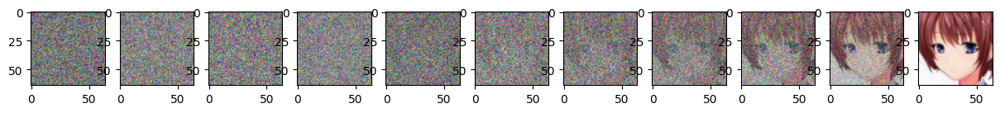

In [ ]:
fig,ax = plt.subplots(1,11, figsize=(15,15))
for i in range(11):
    xt = all_x[min(i*100,len(all_x)-1)]
    xt = (xt-xt.min())/(xt.max()-xt.min())
    ax[i].imshow(xt.cpu().detach().squeeze(0).permute(1,2,0))
plt.show()

In [ ]:
all_xs = []
N = 15
model = torch.load("ANIME_DiffUNet_final.pth")
model = model.to("cuda")
diffusion = DDPM(model, 1000, "cuda")
for i in tqdm(range(1, N+1)):
    noise = torch.randn((1,3,64,64), device="cuda")
    all_x = diffusion.sample_all(noise)
    all_xs.append(all_x)

<ipython-input-8-e3ab34a26b10>:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load("ANIME_DiffUNet_final.pth")
100%|██████████| 15/15 [05:40<00:00, 22.71s/it

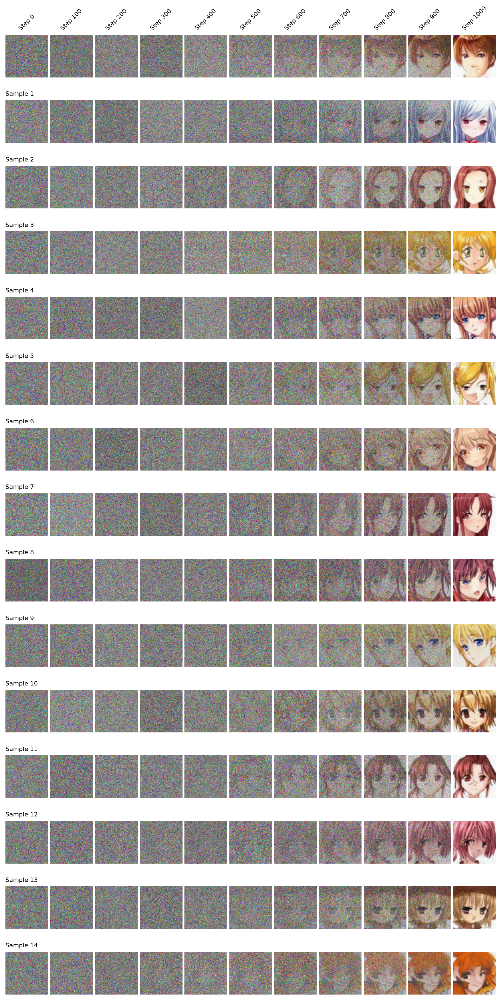

In [ ]:
fig, ax = plt.subplots(
    N, 11, figsize=(10, 20),
    gridspec_kw={'wspace': 0.05, 'hspace': 0.01}
)

for i in range(N):
    all_x = all_xs[i]
    for j in range(11):
        idx = min(j * 100, len(all_x) - 1)
        xt = all_x[idx]

        xt = (xt-xt.min())/(xt.max()-xt.min())

        ax[i, j].imshow(xt.cpu().detach()[0].permute(1, 2, 0))
        ax[i, j].set_axis_off()

        if j == 0 and i!=0:
            ax[i, j].set_title(f"Sample {i}", fontsize=8, loc="left")
        if i == 0:
            ax[i, j].set_title(f"Step {j*100}", fontsize=8, loc="center", rotation=45)

plt.subplots_adjust(top=0.95, bottom=0.05, left=0.05, right=0.95)
plt.show()

### __Train Function for Latent Diffusion__

In [ ]:
def train(model, vae, optim, lr_sched, dl_train, n_steps, n_epochs, device, log=False):
    model = model.to(device)
    vae = vae.to(device)
    diffusion = DDPM(model, n_steps, device)
    tr_ite = 0
    ev_ite = 0
    for e in range(1,n_epochs+1):
        cur_loss = 0
        diffusion.eps_model.train()
        for x in tqdm(dl_train):
            tr_ite += 1
            x = x.to(device)
            with torch.no_grad():
                lat = vae.encoder(x) * 0.18215
            optim.zero_grad()
            loss = diffusion.loss(lat)
            loss.backward()
            nn.utils.clip_grad_norm_(diffusion.eps_model.parameters(), 0.1)
            optim.step()
            lr_sched.step()
            cur_loss += loss.item()
            if log:
                wandb.log({"train_step": tr_ite, "train_loss": loss.item(), "lr": lr_sched.get_last_lr()})
        print(f"Epoch {e} Train Loss = {cur_loss/len(dl_train)}")

        if e%25==0 or e==n_epochs:
            name = e if e != n_epochs else "final"
            torch.save(diffusion.eps_model, f"models/ARTFACE_DiffUNet2_{name}.pth")
    if log:
        wandb.finish()

### __Sample on ARTFACE dataset__

In [ ]:
!wget -O ARTFACE_DiffUNet2_final.pth https://rky.ovh/nextcloud/index.php/s/TE429Q6YjEMWDsR/download/ARTFACE_DiffUNet2_final.pth

--2024-12-16 18:13:44--  https://rky.ovh/nextcloud/index.php/s/TE429Q6YjEMWDsR/download/ARTFACE_DiffUNet2_final.pth
Resolving rky.ovh (rky.ovh)... 92.132.224.116
Connecting to rky.ovh (rky.ovh)|92.132.224.116|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2683564854 (2.5G) [application/octet-stream]
Saving to: ‘ARTFACE_DiffUNet2_final.pth’

ARTFACE_DiffUNet2_f 100%[===================>]   2.50G  17.4MB/s    in 2m 44s  

2024-12-16 18:16:30 (15.6 MB/s) - ‘ARTFACE_DiffUNet2_final.pth’ saved [2683564854/2683564854]



In [ ]:
!git clone https://github.com/madebyollin/taesd.git

Cloning into 'taesd'...
remote: Enumerating objects: 165, done.
remote: Counting objects: 100% (41/41), done.
remote: Compressing objects: 100% (37/37), done.
remote: Total 165 (delta 12), reused 25 (delta 4), pack-reused 124 (from 1)
Receiving objects: 100% (165/165), 150.62 MiB | 12.82 MiB/s, done.
Resolving deltas: 100% (48/48), done.


In [ ]:
from taesd.taesd import TAESD

B = 8

model = torch.load("ARTFACE_DiffUNet2_final.pth").to("cuda")
vae = TAESD("taesd/taesd_encoder.pth", "taesd/taesd_decoder.pth").to("cuda")
diffusion = DDPM(model, 1000, "cuda", vae)
noise = torch.randn((B,4,64,64), device="cuda")
all_x = diffusion.sample(noise * 0.18215)

<ipython-input-11-111e9c23f2e2>:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load("ARTFACE_DiffUNet2_final.pth").to("cuda")


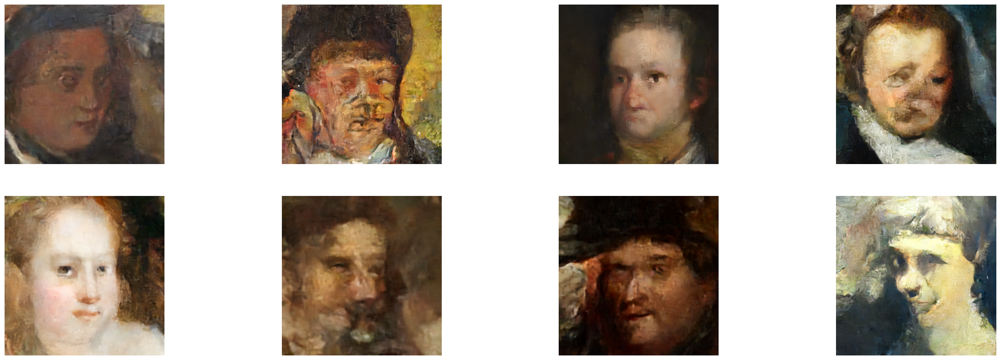

In [ ]:
tf_rev = transforms.ToPILImage()

fig,ax = plt.subplots(2,B//2, figsize=(30,10))
for i in range(2):
    for j in range(B//2):
        xt = all_x[i*B//2+j]
        ax[i,j].imshow(tf_rev(xt))
        ax[i,j].set_axis_off()
plt.show()